In [1]:
# Import libraries
import pandas as pd
import numpy as np
import scipy as sp
from sentence_transformers import SentenceTransformer
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.graph_objects as go
import plotly.express as px
import warnings
import joblib
warnings.filterwarnings("ignore")
plt.style.use("fivethirtyeight")
pd.set_option("display.max_columns", None)

In [2]:
# Read csv file with pandas
path = "C:/Users/USER/Documents/macQaries/bank cluster/data/wrangled_data.csv"
df = pd.read_csv(path)

In [3]:
# Read embedded csv file with pandas
path = "C:/Users/USER/Documents/macQaries/bank cluster/data/embedded_data.csv"
embed_df = pd.read_csv(path)

In [4]:
df.head()

,age,job,marital,education,default,balance,housing,loan
0,58,management,married,tertiary,no,2143,yes,no
1,44,technician,single,secondary,no,29,yes,no
2,33,entrepreneur,married,secondary,no,2,yes,yes
3,47,blue-collar,married,secondary,no,1506,yes,no
4,33,blue-collar,single,secondary,no,1,no,no


In [5]:
embed_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383
0,0.119162,0.022875,0.060804,0.028731,-0.043985,0.027579,-0.069261,-0.042948,-0.000644,0.032379,0.059766,0.007702,-0.013447,0.016876,-0.029202,-0.006613,-0.044690,-0.081409,0.105086,0.056253,-0.057312,-0.017979,-0.052108,-0.041249,0.106165,-0.002750,-0.018338,0.014786,-0.025731,0.010121,0.075214,0.122451,0.039713,0.012749,0.072583,-0.042720,-0.003183,-0.013584,-0.022771,-0.035772,-0.015598,-0.106209,0.027690,-0.076594,-0.033413,0.022871,0.066239,-0.053840,0.012791,0.000361,-0.180499,-0.026982,0.011889,0.076279,-0.001067,0.028931,-0.009145,-0.045633,-0.044924,0.058625,0.009356,0.118472,-0.130307,0.039713,0.001831,0.064206,0.054515,-0.013304,-0.058440,0.071079,0.068496,-0.039354,-0.139262,-0.027049,0.014107,-0.035917,-0.007875,0.064567,0.072548,-0.079771,-0.077375,-0.054401,-0.043395,-0.030145,-0.053276,-0.070141,-0.069196,-0.006886,0.014984,-0.004344,-0.049423,0.012838,0.017099,0.017812,0.049987,-0.085185,-0.022606,0.002882,-0.039366,0.002190,-0.071649,0.052806,0.008402,0.028730,-0.066466,0.019982,0.011304,0.028146,0.006946,0.007073,-0.030902,0.009991,-0.048506,-0.051734,0.000063,-0.046850,0.034546,0.037340,0.067123,0.020221,0.031266,0.079641,-0.018452,-0.025250,-0.077632,-0.035240,-0.085512,0.052517,-0.005487,-0.050180,0.037335,0.059133,-0.055867,0.055602,-0.003914,-0.016963,0.038250,-0.012632,0.079060,0.013212,0.055993,-0.056424,-0.006831,0.057653,-0.023642,0.017088,0.037692,0.067189,0.035394,0.060331,-0.022463,0.006238,-0.039553,-0.107500,-0.005453,-0.053658,0.053371,-0.003820,-0.010733,0.036362,0.027996,-0.021305,-0.025015,-0.028633,-0.006330,-0.034801,0.033703,-0.022377,-0.063315,-0.024051,0.031214,-0.002118,0.006056,-0.016409,0.044446,-0.028978,0.024615,0.143501,-0.042971,0.010768,-0.087924,-0.019758,-0.112157,-0.036754,0.041995,0.050574,-0.136602,-0.048369,-0.046469,-0.090768,-0.064342,-0.014157,-0.078311,0.003246,-0.009435,0.027369,0.070744,0.004222,-0.014370,0.022787,-0.045192,0.091405,0.074592,-0.015415,0.010550,-0.052526,0.073150,0.048048,0.072716,0.067061,-0.010254,0.022667,0.065214,0.061063,0.011978,-0.031032,0.095691,0.062147,0.007681,-0.013057,0.077042,0.039095,0.070538,-0.061377,-0.016151,-0.058539,-0.088403,0.022616,0.057131,-0.060042,0.049972,-0.069857,0.057906,-0.012554,-0.030216,-0.055759,0.057955,0.020283,-0.160394,-0.004065,-0.018962,-0.045288,0.039923,0.078131,-0.029540,0.021729,0.028761,0.060047,0.004092,0.022320,-0.102370,0.017333,0.014518,0.076371,-0.001147,-0.025833,0.084014,0.010703,-0.003175,-0.001790,-0.012071,0.027692,0.038857,0.044053,0.038772,-0.033464,0.035655,0.044103,-0.001741,0.025915,0.01972

### Preprocessing

In [6]:
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder, OneHotEncoder
from sklearn.metrics import classification_report, accuracy_score, calinski_harabasz_score, davies_bouldin_score, silhouette_score
from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer
import shap
import prince

In [7]:
# Predict and eliminate outliers
clf = ECOD()
clf.fit(embed_df)
outliers = clf.predict(embed_df)

In [8]:
# embedded data without outlier
embed_df["outliers"] = outliers
embed_no_outlier = embed_df[embed_df["outliers"] == 0]
embed_no_outlier.drop(["outliers"], axis = 1, inplace = True)

In [9]:
# embedded data with outlier
embed_with_outlier = embed_df.copy()
embed_with_outlier.drop(["outliers"], axis = 1, inplace = True)

In [10]:
# original data without outlier
df["outliers"] = outliers
df_no_outlier = df[df["outliers"] == 0]
df_no_outlier.drop(["outliers"], axis = 1, inplace = True)

In [11]:
print(embed_with_outlier.shape)
print(embed_no_outlier.shape)
print(df_no_outlier.shape)

(45211, 384)
(40690, 384)
(40690, 8)


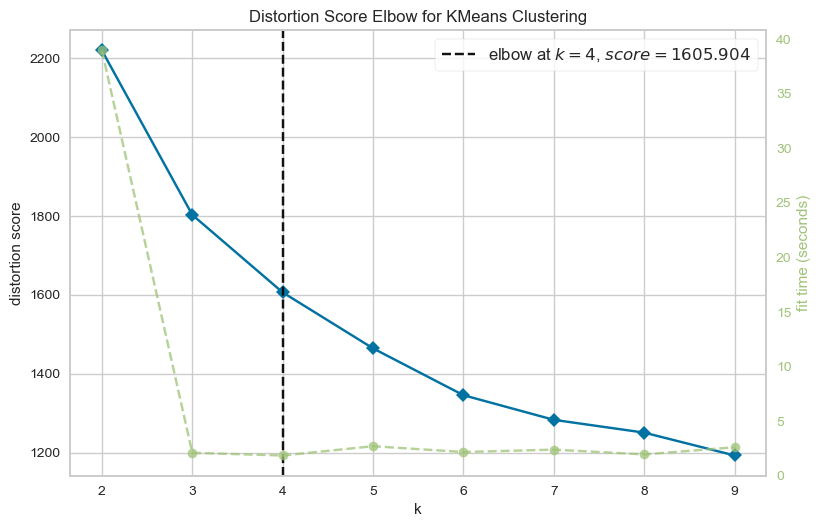

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [12]:
# Instantiate the clustering model and visualizer, and fit the data to the visualizer
km = KMeans(init = "k-means++", random_state = 42, n_init = "auto")
visualizer = KElbowVisualizer(km, k = (2, 10))
visualizer.fit(embed_no_outlier)
visualizer.show()

In [13]:
# The best value for k is between 6-4
value = [4, 5, 6]
for k in value:
    km = KMeans(n_clusters = k, init = "k-means++", n_init = 10, max_iter = 100, random_state = 42)
    clusters = km.fit_predict(embed_no_outlier)
    print(f"Davies Bouldin score for {k} : {davies_bouldin_score(embed_no_outlier, clusters)}")
    print(f"Calinski score for {k} : {calinski_harabasz_score(embed_no_outlier, clusters)}")
    print("\n")

Davies Bouldin score for 4 : 1.8045964509001837
Calinski score for 4 : 8468.855793241984


Davies Bouldin score for 5 : 1.681907905040622
Calinski score for 5 : 8175.992200175955


Davies Bouldin score for 6 : 1.6725509970212358
Calinski score for 6 : 7322.263410584365




In [14]:
# The best value for k is 5. we will model our data with n_cluster = 5
km = KMeans(n_clusters = 5, init = "k-means++")
clusters = km.fit_predict(embed_no_outlier)
print(km.inertia_)
print(np.unique(clusters))

1416.9486083096062
[0 1 2 3 4]


In [15]:
# Evaluate our model with Davies, and Calinski score metric
print(f"Davies Bouldin score : {davies_bouldin_score(embed_no_outlier, clusters)}")
print(f"Calinski score : {calinski_harabasz_score(embed_no_outlier, clusters)}")

Davies Bouldin score : 1.6820577142568538
Calinski score : 8175.9910913207095


In [16]:
# Function that calculates the principal components in 2D
def get_pca2d(df, predict):
    pca_2d_obj = prince.PCA(
        n_components = 2, n_iter = 3,
        rescale_with_mean = True,
        rescale_with_std = True,
        copy = True, check_input = True,
        engine = "sklearn", random_state = 42)
    pca_2d_obj.fit(df)
    pca_2d_df = pca_2d_obj.transform(df)
    pca_2d_df.columns = ["component1", "component2"]
    pca_2d_df["cluster"] = predict
    
    return pca_2d_obj, pca_2d_df

# Function that calculates the principal components in 3D
def get_pca3d(df, predict):
    pca_3d_obj = prince.PCA(
        n_components = 3, n_iter = 3,
        rescale_with_mean = True,
        rescale_with_std = True,
        copy = True, check_input = True,
        engine = "sklearn", random_state = 42)
    pca_3d_obj.fit(df)
    pca_3d_df = pca_3d_obj.transform(df)
    pca_3d_df.columns = ["component1", "component2", "component3"]
    pca_3d_df["cluster"] = predict
    
    return pca_3d_obj, pca_3d_df

# Function that plot the principal components in 2D
def plot_pca_2d(df, title = "PCA space", opacity = 0.8, width_line = 0.1):
    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")
    fig = px.scatter(df, x = "component1", y = "component2",
                        color = "cluster", template = "plotly", color_discrete_sequence = px.colors.qualitative.Vivid,
                        title = title).update_traces(marker = {"size": 4, "opacity": opacity,
                                                               "line": {"width": width_line,
                                                                        "color": "black"}}
                                                    ).update_layout(width = 800, height = 800,
                                                                    autosize = True, showlegend = True,
                                                                    legend = dict(title_font_family = "Times New Roman",
                                                                                  font = dict(size = 20)),
                                                                    scene = dict(xaxis = dict(title = "Component1", titlefont_color = "black"),
                                                                                 yaxis = dict(title = "Component2", titlefont_color = "black")),
                                                                    font = dict(family = "Gilroy", color = "black", size = 15))
    
    fig.show()

# Function that plot the principal components in 3D
def plot_pca_3d(df, title = "PCA space", opacity = 0.8, width_line = 0.1):
    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")
    fig = px.scatter_3d(df, x = "component1", y = "component2", z = "component3",
                        color = "cluster", template = "plotly", color_discrete_sequence = px.colors.qualitative.Vivid,
                        title = title).update_traces(marker = {"size": 4, "opacity": opacity,
                                                               "line": {"width": width_line,
                                                                        "color": "black"}}
                                                    ).update_layout(width = 800, height = 800,
                                                                    autosize = True, showlegend = True,
                                                                    legend = dict(title_font_family = "Times New Roman",
                                                                                  font = dict(size = 20)),
                                                                    scene = dict(xaxis = dict(title = "Component1", titlefont_color = "black"),
                                                                                 yaxis = dict(title = "Component2", titlefont_color = "black"),
                                                                                 zaxis = dict(title = "Component3", titlefont_color = "black")),
                                                                    font = dict(family = "Gilroy", color = "black", size = 15))
    
    fig.show()

In [17]:
pca_3d_object, pca_3d_data = get_pca3d(embed_no_outlier, clusters)

In [18]:
# Lets execute the function
plot_pca_3d(pca_3d_data, title = "3D PCA Space Visualization", opacity = 1)

In [19]:
# Lets execute the function
plot_pca_3d(pca_3d_data, title = "3D PCA Space Visualization", opacity = 0.2)

In [20]:
pca_2d_object, pca_2d_data = get_pca2d(embed_no_outlier, clusters)

In [22]:
plot_pca_2d(pca_2d_data, opacity = 1)

In [23]:
print("The Variability is: ", pca_3d_object.eigenvalues_summary)

The Variability is:            eigenvalue % of variance % of variance (cumulative)
component                                                    
0             69.369        18.06%                     18.06%
1             49.890        12.99%                     31.06%
2             41.330        10.76%                     41.82%


In [24]:
import lightgbm as lgb

[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 355
[LightGBM] [Info] Number of data points in the train set: 40690, number of used features: 8
[LightGBM] [Info] Start training from score -1.970793
[LightGBM] [Info] Start training from score -1.715235
[LightGBM] [Info] Start training from score -1.103515
[LightGBM] [Info] Start training from score -2.137366
[LightGBM] [Info] Start training from score -1.465060
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


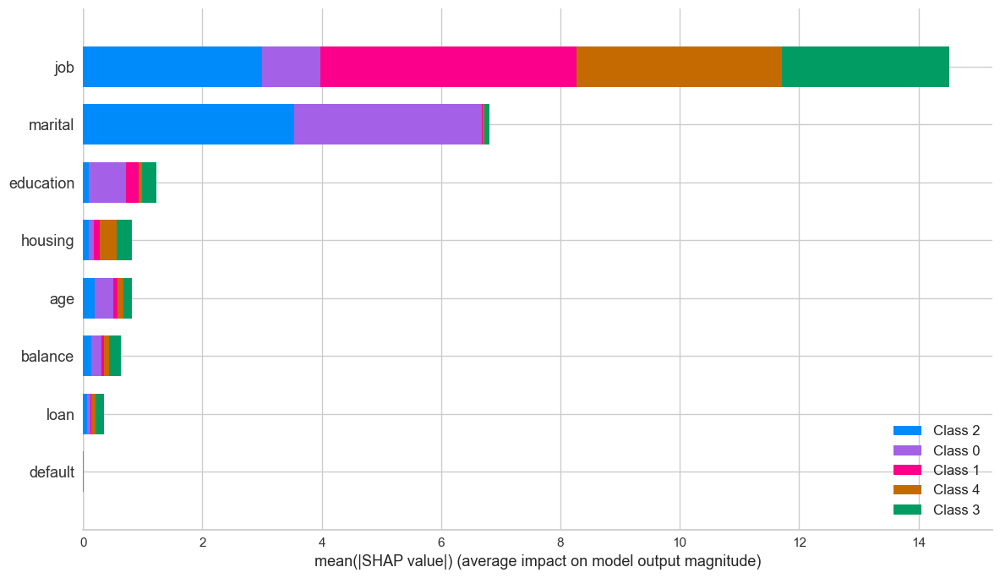

In [25]:
clf_km = lgb.LGBMClassifier(colsample_by_tree = 0.8)
for col in ["job", "marital", "education", "default", "housing", "loan"]:
    df_no_outlier[col] = df_no_outlier[col].astype("category")
clf_km.fit(df_no_outlier, clusters, feature_name = "auto", categorical_feature = "auto")
# SHAP values
explainer_km = shap.TreeExplainer(clf_km)
shap_values_km = explainer_km.shap_values(df_no_outlier)
shap.summary_plot(shap_values_km, df_no_outlier, plot_type = "bar", plot_size = (12, 7))

In [26]:
y_pred = clf_km.predict(df_no_outlier)
print("Training accuracy: {0:0.4f}".format(accuracy_score(y_pred, clusters)))
print(classification_report(clusters, y_pred))

[LightGBM] [Warning] Unknown parameter: colsample_by_tree
Training accuracy: 0.9970
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5670
           1       1.00      1.00      1.00      7321
           2       1.00      0.99      1.00     13497
           3       1.00      1.00      1.00      4800
           4       0.99      1.00      0.99      9402

    accuracy                           1.00     40690
   macro avg       1.00      1.00      1.00     40690
weighted avg       1.00      1.00      1.00     40690



In [27]:
df_no_outlier["clusters"] = clusters
df_no_outlier.shape

(40690, 9)

In [28]:
# Lets analyse the characteristics of the clusters
df_no_outlier.groupby("clusters").agg(
    {
        "job": lambda x: x.value_counts().index[0],
        "marital": lambda x: x.value_counts().index[0],
        "education": lambda x: x.value_counts().index[0],
        "housing": lambda x: x.value_counts().index[0],
        "loan": lambda x: x.value_counts().index[0],
        "age": lambda x: x.mean(),
        "balance": lambda x: x.mean(),
        "default": lambda x: x.value_counts().index[0]
    }
).reset_index()

,clusters,job,marital,education,housing,loan,age,balance,default
0,0,management,single,tertiary,no,no,33.904586,1428.734392,no
1,1,technician,married,secondary,yes,no,39.347903,1227.720393,no
2,2,management,married,tertiary,no,no,45.661406,1625.081574,no
3,3,admin.,married,secondary,yes,no,39.481667,1099.567500,no
4,4,blue-collar,married,secondary,yes,no,40.053393,1054.762178,no
